<a href="https://colab.research.google.com/github/ahatesham02/Bangla-Image-Captioning/blob/main/BAN_CAP_image_captioning_with_dual_Attention_%2B_GRU_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##New

In [1]:


import string
import keras
from numpy import array
from pickle import load
from keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt
from keras.backend import set_session
import sys, time, os, warnings 
warnings.filterwarnings("ignore")
import re

import numpy as np
import pandas as pd 
from PIL import Image
import pickle
from collections import Counter
from keras.utils import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers import add
from keras.callbacks import ModelCheckpoint
from keras.utils import load_img, img_to_array
from sklearn.utils import shuffle
from keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [2]:
!wget -q https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip

!unzip -qq Flickr8k_Dataset.zip

In [8]:
data = pd.read_csv('/content/drive/MyDrive/Image Caption Generation /Bancap/Bancap_preprocessed.csv')
     

In [9]:
from os import listdir
## The location of the Flickr8K_ photos
image_dir = '/content/Flicker8k_Dataset'
images = listdir(image_dir)
print(len(images))

8091


In [10]:
data.head(10)
data.drop(['Unnamed: 0'], axis =1, inplace=True)

In [11]:
data.head()

,filename,caption
0,1000268201_693b08cb0e.jpg,একটি গোলাপী জামা পরা বাচ্চা মেয়ে একটি বাড়ির প্...
1,1000268201_693b08cb0e.jpg,একটি মেয়ে শিশু একটি কাঠের বাড়িতে ঢুকছে
2,1000268201_693b08cb0e.jpg,একটি বাচ্চা তার কাঠের খেলাঘরে উঠছে
3,1000268201_693b08cb0e.jpg,ছোট মেয়েটি তার খেলার ঘরের সিড়ি বেয়ে উঠছে
4,1000268201_693b08cb0e.jpg,গোলাপি জামা পড়া ছোট একটি মেয়ে একটি কাঠের তৈরি...


In [12]:
from pickle import load

total_captions = load(open('/content/drive/MyDrive/Image Caption Generation /Bancap/bancap_captions.pkl', 'rb'))
img_name_vector = load(open('/content/drive/MyDrive/Image Caption Generation /Bancap/bancap_img_names.pkl', 'rb'))

In [13]:
df = pd.DataFrame(list(zip(img_name_vector, total_captions)),
               columns =['filename', 'captions'])
df.head(10)

,filename,captions
0,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> একটি গোলাপী জামা পরা বাচ্চা মেয়ে একটি ...
1,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> একটি মেয়ে শিশু একটি কাঠের বাড়িতে ঢুকছে...
2,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> একটি বাচ্চা তার কাঠের খেলাঘরে উঠছে <...
3,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> ছোট মেয়েটি তার খেলার ঘরের সিড়ি বেয়ে উঠ...
4,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> গোলাপি জামা পড়া ছোট একটি মেয়ে একটি কা...
5,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> একটি কালো কুকুর এবং একটি ছোপওয়ালা কুকু...
6,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> একটি কালো কুকুর একটি তিন রঙা কুকুরের স...
7,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> একটি কালো কুকুর ও একটি সাদা বাদামি ছোপ...
8,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> ভিন্ন জাতের দুটি কুকুর রাস্তায় একে অপ...
9,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> রাস্তার পাশে দুইটি কুকুর পরস্পরের দিকে...


In [14]:
filt =['<start>','<unk>','<end>'] 

In [15]:
grouped_df = df.groupby('filename')['captions'].apply(list).reset_index(name='captions')
grouped_df['captions'] = [[caption.split() for caption in captions] for captions in grouped_df['captions']]

In [16]:
grouped_df['captions'][4]

[['<start>',
  'কমলা',
  'টুপি',
  'পরিহিত',
  'একজন',
  'পুরুষ',
  'কোনোকিছুর',
  'দিকে',
  'তাকিয়ে',
  'আছে',
  '<end>'],
 ['<start>',
  'একজন',
  'মানুষ',
  'কমলা',
  'রঙের',
  'টুপি',
  'পরেছ',
  'এবং',
  'চশমাও',
  'পরেছে',
  '<end>'],
 ['<start>',
  'চশমাযুক্ত',
  'একজন',
  'ব্যক্তি',
  'একটি',
  'ব্লিটজ',
  'টুপি',
  'পরেছেন',
  '<end>'],
 ['<start>',
  'চশমা',
  'পরিহিত',
  'একজন',
  'ব্যক্তি',
  'বিয়ারের',
  'কৌটা',
  'দিয়ে',
  'বানানো',
  'টুপি',
  'পরে',
  'আছে',
  '<end>'],
 ['<start>',
  'কান',
  'ফোঁড়ানো',
  'ব্যক্তিটি',
  'চশমা',
  'এবং',
  'কমলা',
  'টুপি',
  'পরেছে',
  '<end>']]

In [17]:
for i, row in grouped_df.iterrows():
    captions = row['captions']
    captions = [caption[1:-1] for caption in captions]
    grouped_df.at[i, 'captions'] = captions

In [18]:
grouped_df['captions'][4]

[['কমলা',
  'টুপি',
  'পরিহিত',
  'একজন',
  'পুরুষ',
  'কোনোকিছুর',
  'দিকে',
  'তাকিয়ে',
  'আছে'],
 ['একজন', 'মানুষ', 'কমলা', 'রঙের', 'টুপি', 'পরেছ', 'এবং', 'চশমাও', 'পরেছে'],
 ['চশমাযুক্ত', 'একজন', 'ব্যক্তি', 'একটি', 'ব্লিটজ', 'টুপি', 'পরেছেন'],
 ['চশমা',
  'পরিহিত',
  'একজন',
  'ব্যক্তি',
  'বিয়ারের',
  'কৌটা',
  'দিয়ে',
  'বানানো',
  'টুপি',
  'পরে',
  'আছে'],
 ['কান', 'ফোঁড়ানো', 'ব্যক্তিটি', 'চশমা', 'এবং', 'কমলা', 'টুপি', 'পরেছে']]

In [19]:
grouped_df.captions[6]

[['সাদা',
  'বেড়ি',
  'যুক্ত',
  'ঘাসে',
  'আবৃত',
  'একটি',
  'বাগানে',
  'একটি',
  'সাদা',
  'কালো',
  'কুকুর',
  'দৌড়াচ্ছে'],
 ['একটি', 'সাদাকালো', 'রঙের', 'কুকুর', 'ঘাসের', 'উপর', 'দৌড়াচ্ছে'],
 ['ঘাসের', 'উপর', 'একটি', 'বোস্টন', 'টেরিয়ার', 'কুকুর', 'দৌড়াচ্ছে'],
 ['একটি',
  'বোস্টন',
  'টেরিয়ার',
  'জাতের',
  'কুকুর',
  'সাদা',
  'বেড়ার',
  'সামনে',
  'দিয়ে',
  'ঘন',
  'সবুজ',
  'ঘাসের',
  'মধ্যে',
  'দৌড়ে',
  'যাচ্ছে'],
 ['কাঠের', 'বেড়ার', 'পাশে', 'কুকুরটি', 'সবুজ', 'ঘাসের', 'উপর', 'দৌড়াচ্ছে']]

In [20]:
train_data, test_data, train_caption, test_caption = train_test_split(img_name_vector, total_captions, test_size = 0.1, random_state = 42)

In [21]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input

In [22]:
image_model = ResNet50(include_top=False,weights='imagenet')
new_input = image_model.input 
hidden_layer = image_model.layers[-1].output  
image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)

94765736/94765736 [==============================] - 5s 0us/step


In [23]:
image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                           

In [24]:
preprocessed_image = []
IMAGE_SHAPE = (224, 224)

In [25]:
for img in train_data[0:5] :
    img = tf.io.read_file(img, name=None)
    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, (224, 224))
    img = tf.keras.applications.resnet50.preprocess_input(img)
    preprocessed_image.append(img)

Shape after resize :  (224, 224, 3)


Shape after resize :  (224, 224, 3)


Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)


Shape after resize :  (224, 224, 3)


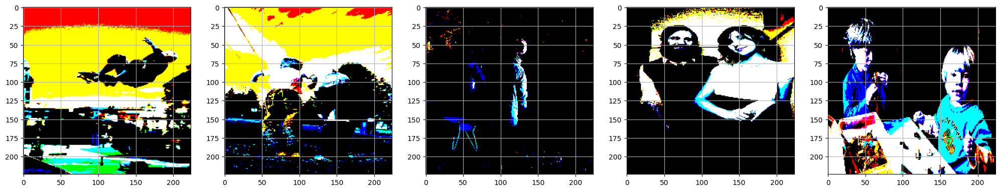

In [26]:
# checking first five images post preprocessing
Display_Images = preprocessed_image[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(25)
for ax, image in zip(axes, Display_Images) :
  print('Shape after resize : ', image.shape)
  ax.imshow(image)
  ax.grid('off')

Shape after resize : (224, 224, 3)


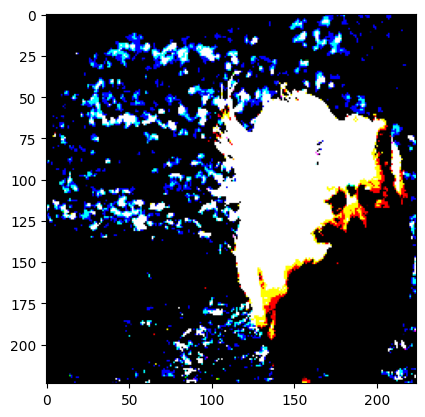

In [27]:
def load_images(image_path) :
  img = tf.io.read_file(image_path, name = None)
  img = tf.image.decode_jpeg(img, channels=0)
  img = tf.image.resize(img, IMAGE_SHAPE)
  img = preprocess_input(img)
  return img, image_path

img1,img1_path = load_images("Flicker8k_Dataset/3439243433_d5f3508612.jpg")
print("Shape after resize :", img1.shape)
plt.imshow(img1)

## Tokenizer and Vocabulary

In [28]:
tokenizer = tf.keras.preprocessing.text.Tokenizer(
                                                 oov_token="<unk>",
                                                 filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

tokenizer.fit_on_texts(train_caption)
train_seqs = tokenizer.texts_to_sequences(train_caption)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

train_seqs = tokenizer.texts_to_sequences(train_caption)
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [29]:
vocab_size = len(tokenizer.index_word)+1

In [30]:
vocab_size

14674

In [31]:
train_caption[:3]

['<start> একজন লোক স্কেটবোর্ডে চড়ে শূন্যে লাফ দিয়ে ভেসে আছে <end>',
 '<start> দুজন শিশু বালক একটি সুন্দর দিনে পাডলের উপর খেলছে <end>',
 '<start> হুইলবারোর কাছে দাঁড়িয়ে থাকা দুটি শিশু তাদের সামনে হ্রদের দিকে তাকিয়ে আছে  <end>']

In [32]:
train_seqs[:3]

[[2, 5, 9, 257, 182, 116, 38, 25, 656, 7, 3],
 [2, 69, 43, 68, 4, 667, 434, 7252, 13, 16, 3],
 [2, 7253, 121, 46, 84, 18, 43, 112, 39, 473, 37, 156, 7, 3]]

In [33]:
tokenizer.index_word

{1: '<unk>',
 2: '<start>',
 3: '<end>',
 4: 'একটি',
 5: 'একজন',
 6: 'কুকুর',
 7: 'আছে',
 8: 'এক',
 9: 'লোক',
 10: 'করছে',
 11: 'এবং',
 12: 'কালো',
 13: 'উপর',
 14: 'সাদা',
 15: 'মহিলা',
 16: 'খেলছে',
 17: 'বসে',
 18: 'দুটি',
 19: 'তার',
 20: 'রঙের',
 21: 'লাল',
 22: 'ছেলে',
 23: 'পরা',
 24: 'ছোট',
 25: 'দিয়ে',
 26: 'পরিহিত',
 27: 'ও',
 28: 'নীল',
 29: 'মধ্যে',
 30: 'বাচ্চা',
 31: 'দাঁড়িয়ে',
 32: 'নিয়ে',
 33: 'ব্যক্তি',
 34: 'পাশে',
 35: 'করে',
 36: 'দিচ্ছে',
 37: 'দিকে',
 38: 'লাফ',
 39: 'সামনে',
 40: 'দৌড়াচ্ছে',
 41: 'মেয়ে',
 42: 'ধরে',
 43: 'শিশু',
 44: 'যাচ্ছে',
 45: 'দিয়ে',
 46: 'দাঁড়িয়ে',
 47: 'থেকে',
 48: 'জামা',
 49: 'ঘাসের',
 50: 'পরে',
 51: 'বল',
 52: 'কুকুরটি',
 53: 'সাথে',
 54: 'নিয়ে',
 55: 'বাদামী',
 56: 'পানিতে',
 57: 'মেয়ে',
 58: 'কিছু',
 59: 'জন্য',
 60: 'সবুজ',
 61: 'একদল',
 62: 'হলুদ',
 63: 'মাঠে',
 64: 'পোশাক',
 65: 'দুই',
 66: 'মুখে',
 67: 'আছেন',
 68: 'বালক',
 69: 'দুজন',
 70: 'মানুষ',
 71: 'লোকটি',
 72: 'হাতে',
 73: 'দেখছে',
 74: 'সাইকেল',
 75: 'নারী',
 76: '

In [34]:
# Pad each vector to the max_length of the captions  store it to a vairable

train_seqs_len = [len(seq) for seq in train_seqs]

longest_word_length = max(train_seqs_len)

cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding= 'post', maxlen = longest_word_length,
                                                          dtype='int32', value=0)
print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(36000, 34)


In [35]:
cap_vector

array([[    2,     5,     9, ...,     0,     0,     0],
       [    2,    69,    43, ...,     0,     0,     0],
       [    2,  7253,   121, ...,     0,     0,     0],
       ...,
       [    2,   187,   257, ...,     0,     0,     0],
       [    2, 14672,  1770, ...,     0,     0,     0],
       [    2,   216,    74, ...,     0,     0,     0]], dtype=int32)

## Creating Dataset

In [36]:
# Map each image full path to the function, in order to preprocess the image
training_list = sorted(set(train_data))
New_Img = tf.data.Dataset.from_tensor_slices(training_list)
New_Img = New_Img.map(load_images, num_parallel_calls = tf.data.experimental.AUTOTUNE)
New_Img = New_Img.batch(64, drop_remainder=False)

In [37]:
path_train, path_test, caption_train, caption_test = train_test_split(train_data, cap_vector, test_size = 0.1, random_state = 42)

In [38]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(caption_train)))
print("Testing data for Captions: " + str(len(caption_test)))

Training data for images: 32400
Testing data for images: 3600
Training data for Captions: 32400
Testing data for Captions: 3600


In [39]:
from tqdm import tqdm

In [40]:
New_Img

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [41]:
# extract features from each image in the dataset
img_features = {}
for image, image_path in tqdm(New_Img) :
  batch_features = image_features_extract_model(image)
  #squeeze out the features in a batch
  batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))
  for batch_feat, path in zip(batch_features_flattened, image_path) :
    feature_path = path.numpy().decode('utf-8')
    img_features[feature_path] = batch_feat.numpy()

100%|██████████| 125/125 [00:42<00:00,  2.92it/s]


In [42]:
batch_features

<tf.Tensor: shape=(64, 7, 7, 2048), dtype=float32, numpy=
array([[[[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 4.7711940e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 1.1169077e+00],
         ...,
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

        [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 1.2774032e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 5.0966322e-01]

In [43]:
batch_features_flattened

<tf.Tensor: shape=(64, 49, 2048), dtype=float32, numpy=
array([[[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  4.771194  ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  1.1169077 ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  7.961609  ,
          0.        ,  0.        ],
        [ 0.21795821,  0.        ,  0.        , ...,  1.0829487 ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  1.4408458 ,
          0.        ,  1.5932412 ]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...

In [44]:
batch_feat.shape

TensorShape([49, 2048])

In [45]:
img_features 

{'/content/Flicker8k_Dataset/1000268201_693b08cb0e.jpg': array([[0.       , 0.       , 0.       , ..., 3.2088284, 0.       ,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
         0.       ],
        [0.       , 2.5231423, 0.       , ..., 0.       , 0.       ,
         0.       ],
        ...,
        [0.       , 0.       , 0.       , ..., 0.       , 6.8373046,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 3.8534644,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 4.3590107,
         0.       ]], dtype=float32),
 '/content/Flicker8k_Dataset/1001773457_577c3a7d70.jpg': array([[0.        , 0.        , 0.        , ..., 0.61871135, 0.        ,
         0.        ],
        [1.4099102 , 0.        , 0.        , ..., 0.        , 5.1975617 ,
         0.        ],
        [4.414052  , 0.        , 0.5123825 , ..., 0.        , 4.637478  ,
         0.        ],
        ...,
        [0.062016

In [46]:
#to provide, both images along with the captions as input
def map(image_name, caption):
    img_tensor = img_features[image_name.decode('utf-8')]
    return img_tensor, caption

In [47]:
# This function should transform the created dataset(img_path,cap) to (features,cap) using the map_func created earlier
BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):
        
    data = tf.data.Dataset.from_tensor_slices((img, capt))
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE)
    
     
    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))
    return data

In [48]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [49]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size,max_len)

(64, 49, 2048)
(64, 34)


In [50]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
train_num_steps = len(path_train) // BATCH_SIZE 
test_num_steps = len(path_test) // BATCH_SIZE 
EPOCHS = 20
max_length = 108
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]

In [51]:
vocab_size

14674

In [52]:
feature_shape

2048

In [53]:
attention_feature_shape

49

## CNN Encoder

In [54]:
from keras.utils.vis_utils import plot_model

In [55]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

In [56]:
#Building Encoder using CNN Keras subclassing method

class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) #build your Dense layer with relu activation
        
    def call(self, features):
        features =  self.dense(features) # extract the features from the image shape: (batch, 8*8, embed_dim)
        features =  tf.keras.activations.relu(features, alpha=0.01, max_value=None, threshold=0)
        return features

In [57]:
encoder=Encoder(embedding_dim)

## Attention Model

In [65]:
class Attention(Model):
    def __init__(self, units):
        super(Attention, self).__init__()
        self.units=units
        self.W1 = tf.keras.layers.Dense(units) 
        self.W2 = tf.keras.layers.Dense(units) 
        self.V = tf.keras.layers.Dense(1) 
        

    def call(self, features, hidden):
        hidden_with_time_axis = hidden[:, tf.newaxis]
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))  
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1) 
        context_vector = attention_weights * features 
        context_vector = tf.reduce_sum(context_vector, axis=1)  
        return context_vector, attention_weights

In [66]:
class Attention2(Model):
    def __init__(self, units):
        super(Attention2, self).__init__()
        self.units=units
        self.W1 = tf.keras.layers.Dense(units) 
        self.W2 = tf.keras.layers.Dense(units) 
        self.V = tf.keras.layers.Dense(1) 
        

    def call(self, features, hidden):
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden))  
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1) 
        context_vector = attention_weights * features 
        context_vector = tf.reduce_sum(context_vector, axis=1)  
        return context_vector, attention_weights

In [67]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Attention(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform'))
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer
        

    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state,_ = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [68]:
class Decoder_dual(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder_dual, self).__init__()
        self.units=units
        self.attention = Attention(self.units) #iniitalise your Attention model with units
        self.attention2 = Attention2(self.units)
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform')
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer
        self.dense = tf.keras.layers.Dense(embed_dim)
        

    def call(self,x,features, hidden):
        context_vector1, attention_weights1 = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed1 = tf.concat([tf.expand_dims(context_vector1, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output1,state1= self.gru(embed1) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output1 = self.dense(output1)
        #state1 = self.dense(state1)
        context_vector2, attention_weights2 = self.attention2(output1, embed)
        context_vector = tf.keras.layers.Add()([context_vector1, context_vector2])
        embed2 = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1)
        output,state= self.gru(embed2)
        attention_weights = tf.keras.layers.Add()([attention_weights1, attention_weights2])
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights1
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [69]:
decoder=Decoder_dual(embedding_dim, units, vocab_size)

In [70]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim

Feature shape from Encoder: (64, 49, 256)
Predcitions shape from Decoder: (64, 14674)
Attention weights shape from Decoder: (64, 49, 1)


In [71]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)  #define the optimizer
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE)

In [72]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    #loss is getting multiplied with mask to get an ideal shape
    
    return tf.reduce_mean(loss_)

In [79]:
checkpoint_path = "/content/drive/MyDrive/Image Caption Generation /Bancap/Models/Dual Attention/"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [80]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [81]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape:
        
        encoder_op = encoder(img_tensor)
        for r in range(1, target.shape[1]) :
          predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
          loss = loss + loss_function(target[:, r], predictions) 
          dec_input = tf.expand_dims(target[:, r], 1)  

    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) 
    optimizer.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss

In [82]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size = target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
      encoder_op = encoder(img_tensor)
      for r in range(1, target.shape[1]) :
        predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
        loss = loss + loss_function(target[:, r], predictions)
        dec_input = tf.expand_dims(target[: , r], 1)
    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) 
    optimizer.apply_gradients(zip(grad, trainable_vars))                      
    return loss, avg_loss

In [83]:
def test_loss_cal(test_dataset):
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset) :
      batch_loss, t_loss = test_step(img_tensor, target)
      total_loss = total_loss + t_loss
      avg_test_loss = total_loss/ test_num_steps

    return avg_test_loss

In [84]:
loss_plot = []
test_loss_plot = []
EPOCHS = 30
best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps   
    loss_plot.append(avg_train_loss)    
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|          | 0/30 [00:00<?, ?it/s]

For epoch: 1, the train loss is 1.594, & test loss is 1.326
Time taken for 1 epoch 312.60463404655457 sec

Test loss has been reduced from 100.000 to 1.326


  3%|▎         | 1/30 [05:13<2:31:21, 313.17s/it]

For epoch: 2, the train loss is 1.196, & test loss is 1.132
Time taken for 1 epoch 88.77294993400574 sec

Test loss has been reduced from 1.326 to 1.132


  7%|▋         | 2/30 [06:42<1:24:41, 181.47s/it]

For epoch: 3, the train loss is 1.062, & test loss is 1.023
Time taken for 1 epoch 86.92987370491028 sec

Test loss has been reduced from 1.132 to 1.023


 10%|█         | 3/30 [08:09<1:02:19, 138.51s/it]

For epoch: 4, the train loss is 0.971, & test loss is 0.935
Time taken for 1 epoch 87.21593904495239 sec

Test loss has been reduced from 1.023 to 0.935


 13%|█▎        | 4/30 [09:37<51:20, 118.47s/it]  

For epoch: 5, the train loss is 0.890, & test loss is 0.867
Time taken for 1 epoch 87.09533357620239 sec

Test loss has been reduced from 0.935 to 0.867


 17%|█▋        | 5/30 [11:05<44:43, 107.33s/it]

For epoch: 6, the train loss is 0.823, & test loss is 0.791
Time taken for 1 epoch 86.94434905052185 sec

Test loss has been reduced from 0.867 to 0.791


 20%|██        | 6/30 [12:33<40:17, 100.74s/it]

For epoch: 7, the train loss is 0.754, & test loss is 0.731
Time taken for 1 epoch 86.23224210739136 sec

Test loss has been reduced from 0.791 to 0.731


 23%|██▎       | 7/30 [13:59<36:51, 96.15s/it] 

For epoch: 8, the train loss is 0.696, & test loss is 0.680
Time taken for 1 epoch 86.56975841522217 sec

Test loss has been reduced from 0.731 to 0.680


 27%|██▋       | 8/30 [15:27<34:13, 93.36s/it]

For epoch: 9, the train loss is 0.674, & test loss is 0.646
Time taken for 1 epoch 86.5829975605011 sec

Test loss has been reduced from 0.680 to 0.646


 30%|███       | 9/30 [16:54<31:59, 91.40s/it]

For epoch: 10, the train loss is 0.610, & test loss is 0.585
Time taken for 1 epoch 86.39713215827942 sec

Test loss has been reduced from 0.646 to 0.585


 33%|███▎      | 10/30 [18:21<30:00, 90.03s/it]

For epoch: 11, the train loss is 0.597, & test loss is 0.576
Time taken for 1 epoch 86.14367961883545 sec

Test loss has been reduced from 0.585 to 0.576


 37%|███▋      | 11/30 [19:47<28:10, 88.99s/it]

For epoch: 12, the train loss is 0.552, & test loss is 0.522
Time taken for 1 epoch 86.26785778999329 sec

Test loss has been reduced from 0.576 to 0.522


 40%|████      | 12/30 [21:15<26:32, 88.47s/it]

For epoch: 13, the train loss is 0.507, & test loss is 0.488
Time taken for 1 epoch 86.51541042327881 sec

Test loss has been reduced from 0.522 to 0.488


 43%|████▎     | 13/30 [22:42<24:56, 88.03s/it]

For epoch: 14, the train loss is 0.471, & test loss is 0.454
Time taken for 1 epoch 86.48308491706848 sec

Test loss has been reduced from 0.488 to 0.454


 47%|████▋     | 14/30 [24:09<23:25, 87.82s/it]

For epoch: 15, the train loss is 0.452, & test loss is 0.429
Time taken for 1 epoch 86.34443998336792 sec

Test loss has been reduced from 0.454 to 0.429


 50%|█████     | 15/30 [25:36<21:52, 87.52s/it]

For epoch: 16, the train loss is 0.435, & test loss is 0.409
Time taken for 1 epoch 86.40008687973022 sec

Test loss has been reduced from 0.429 to 0.409


 53%|█████▎    | 16/30 [27:03<20:23, 87.37s/it]

For epoch: 17, the train loss is 0.434, & test loss is 0.404
Time taken for 1 epoch 86.5405662059784 sec

Test loss has been reduced from 0.409 to 0.404


 60%|██████    | 18/30 [29:56<17:22, 86.88s/it]

For epoch: 18, the train loss is 0.394, & test loss is 0.408
Time taken for 1 epoch 85.99571681022644 sec

For epoch: 19, the train loss is 0.376, & test loss is 0.382
Time taken for 1 epoch 86.10806488990784 sec

Test loss has been reduced from 0.404 to 0.382


 67%|██████▋   | 20/30 [32:49<14:27, 86.77s/it]

For epoch: 20, the train loss is 0.348, & test loss is 0.450
Time taken for 1 epoch 86.46042275428772 sec

For epoch: 21, the train loss is 0.359, & test loss is 0.338
Time taken for 1 epoch 86.6336624622345 sec

Test loss has been reduced from 0.382 to 0.338


 70%|███████   | 21/30 [34:16<13:01, 86.87s/it]

For epoch: 22, the train loss is 0.315, & test loss is 0.319
Time taken for 1 epoch 86.25138664245605 sec

Test loss has been reduced from 0.338 to 0.319


 73%|███████▎  | 22/30 [35:43<11:34, 86.83s/it]

For epoch: 23, the train loss is 0.303, & test loss is 0.296
Time taken for 1 epoch 86.31810235977173 sec

Test loss has been reduced from 0.319 to 0.296


 77%|███████▋  | 23/30 [37:10<10:08, 86.92s/it]

For epoch: 24, the train loss is 0.295, & test loss is 0.292
Time taken for 1 epoch 86.21847605705261 sec

Test loss has been reduced from 0.296 to 0.292


 80%|████████  | 24/30 [38:37<08:41, 86.85s/it]

For epoch: 25, the train loss is 0.295, & test loss is 0.288
Time taken for 1 epoch 86.55218386650085 sec

Test loss has been reduced from 0.292 to 0.288


 83%|████████▎ | 25/30 [40:04<07:15, 87.06s/it]

For epoch: 26, the train loss is 0.276, & test loss is 0.272
Time taken for 1 epoch 86.71787452697754 sec

Test loss has been reduced from 0.288 to 0.272


 90%|█████████ | 27/30 [42:58<04:20, 86.85s/it]

For epoch: 27, the train loss is 0.294, & test loss is 0.281
Time taken for 1 epoch 86.27402353286743 sec



 93%|█████████▎| 28/30 [44:24<02:53, 86.68s/it]

For epoch: 28, the train loss is 0.263, & test loss is 0.277
Time taken for 1 epoch 86.26868319511414 sec

For epoch: 29, the train loss is 0.270, & test loss is 0.252
Time taken for 1 epoch 86.40071892738342 sec

Test loss has been reduced from 0.272 to 0.252


 97%|█████████▋| 29/30 [45:51<01:26, 86.78s/it]

For epoch: 30, the train loss is 0.257, & test loss is 0.242
Time taken for 1 epoch 86.34332466125488 sec

Test loss has been reduced from 0.252 to 0.242


100%|██████████| 30/30 [47:18<00:00, 94.62s/it]


In [85]:
ckpt_manager.checkpoints

['/content/drive/MyDrive/Image Caption Generation /Bancap/Models/Dual Attention/ckpt-22',
 '/content/drive/MyDrive/Image Caption Generation /Bancap/Models/Dual Attention/ckpt-23',
 '/content/drive/MyDrive/Image Caption Generation /Bancap/Models/Dual Attention/ckpt-24',
 '/content/drive/MyDrive/Image Caption Generation /Bancap/Models/Dual Attention/ckpt-25',
 '/content/drive/MyDrive/Image Caption Generation /Bancap/Models/Dual Attention/ckpt-26']

In [87]:
ckpt.restore('/content/drive/MyDrive/Image Caption Generation /Bancap/Models/Dual Attention/ckpt-26')

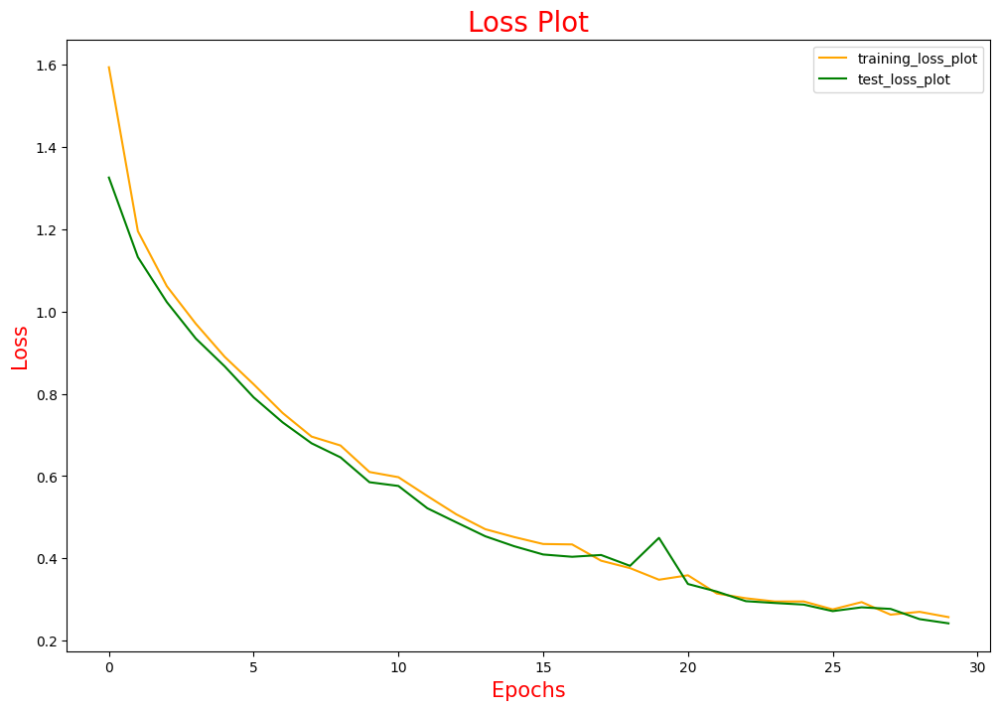

In [88]:
from matplotlib.pyplot import figure
figure(figsize=(12, 8))
plt.plot(loss_plot, color='orange', label = 'training_loss_plot')
plt.plot(test_loss_plot, color='green', label = 'test_loss_plot')
plt.xlabel('Epochs', fontsize = 15, color = 'red')
plt.ylabel('Loss', fontsize = 15, color = 'red')
plt.title('Loss Plot', fontsize = 20, color = 'red')
plt.legend()
plt.show()

In [89]:
attention_feature_shape

49

In [90]:
attention_plot = np.zeros((max_length, attention_feature_shape))
attention_plot

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [91]:
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
font_path = '/content/drive/MyDrive/Image Caption Generation /SolaimanLipi_20-04-07.ttf'
prop = fm.FontProperties(fname=font_path)

In [92]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_feature_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0) 
    img_tensor_val = image_features_extract_model(temp_input) 
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder (img_tensor_val) 

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden) 
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy() 
        result.append (tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions

In [93]:
def plot_attention_map(caption, weights, image) :

  fig = plt.figure(figsize = (12, 12))
  temp_img = np.array(Image.open(image))

  cap_len = len(caption)
  for cap in range(len(caption)) :
    weights_img = np.reshape(weights[cap], (7,7))
    wweights_img = np.array(Image.fromarray(weights_img).resize((224,224), Image.LANCZOS))

    ax = fig.add_subplot(cap_len//2, cap_len//2, cap+1)
    ax.set_title(caption[cap], fontsize = 38, color = 'red',fontproperties=prop)

    img = ax.imshow(temp_img)

    ax.imshow(weights_img, cmap='gray', alpha=0.6, extent=img.get_extent())
    ax.axis('off')
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  plt.show()

In [94]:
def filt_text(text):
    filt=['<start>','<unk>','<end>'] 
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [95]:
image_test = path_test.copy()

In [96]:
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction

In [97]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [98]:
from nltk.translate.meteor_score import meteor_score

In [99]:
encoder.save_weights('content/outputs_encoder')
decoder.save_weights('.content/outputs_decoder')

BLEU-1: 3.738318
BLEU-2: 3.252713
BLEU-3: 2.407816
BLEU-4: 2.098093
Meteor Score: 0.209497
Real Caption: দুই বাচ্চা তাদের কুকুর নিয়ে বরফের মধ্যে খেলছে
Prediction Caption: দুই বাচ্চা তাদের কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং একটি কুকুর এবং


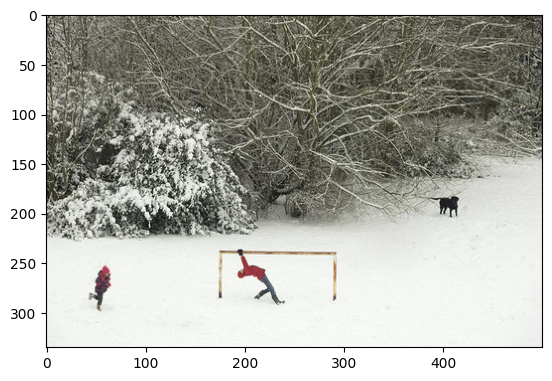

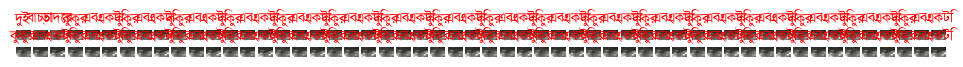

In [101]:
cap_test_data = caption_test.copy()
rid = 101

test_image= path_test[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test_data[rid] if i not in [0]])
result, attention_plot, pred_test = evaluate(test_image)
real_caption=filt_text(real_caption)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)
score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', pred_caption)

plot_attention_map(result, attention_plot, test_image)


In [102]:
len(test_data)

4000

## Evaluation

Real Caption: ['এক ছেলে পানিতে ঢিল মারছে', 'একটি ছোট ছেলে নীল জমা পরে লেকের পাড়ে হাতে কিছু একটা নিয়ে দাঁড়িয়ে আছে', 'পানিতে পাথর ছোড়ার জন্য একটি ছোট ছেলে প্রস্তুত', 'একটি সেতুর কাছাকাছি পাথর ছাড়ছে', 'একটি বাচ্চা ছেলে নদীর ধারে দাঁড়িয়ে পাথর ছুঁড়ছে']
Prediction Caption: একটি ছেলে পানির পাশে হেঁটে যাচ্ছে
BLEU-1: 33.333333
BLEU-2: 10.929347
BLEU-3: 5.689085
BLEU-4: 4.470634
Meteor Score: 0.128205


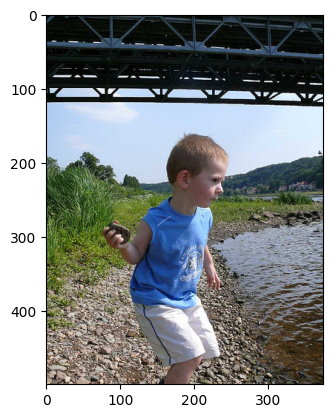

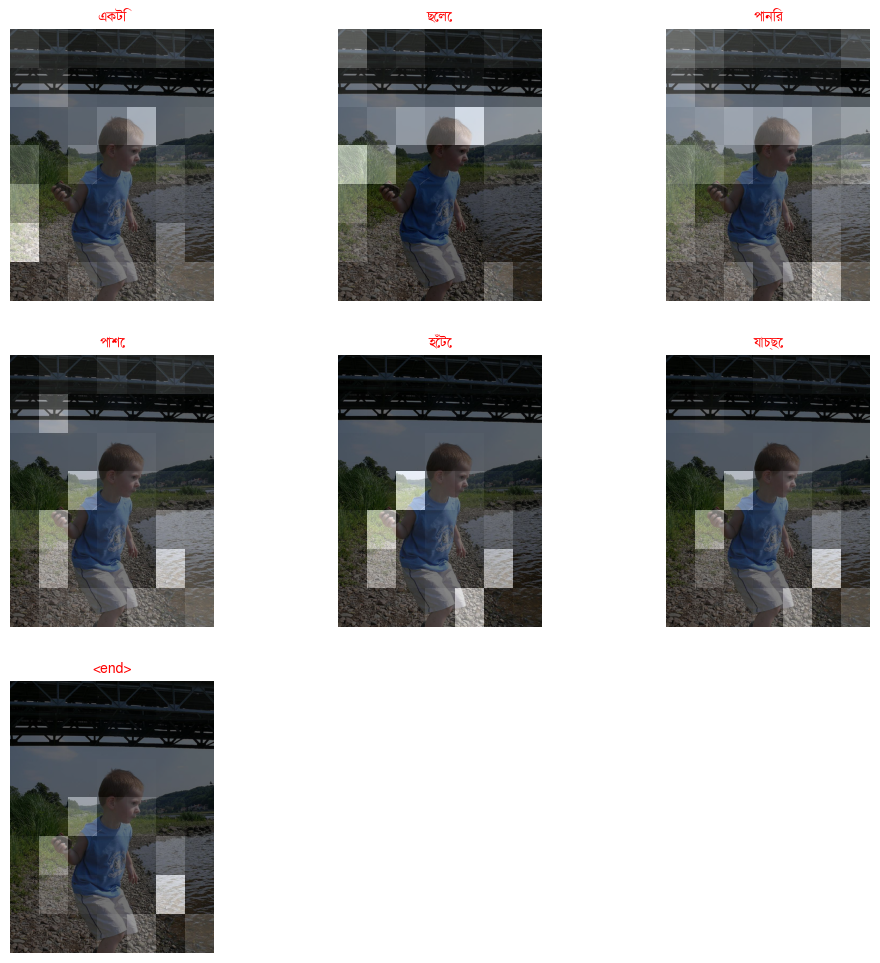

In [104]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['সুইমিংপুলে একটি বালক', 'একটি ছেলেকে সুইমিং পুলে পানি ছড়িয়ে দিচ্ছে', 'একটি ছেলে পানিতে ছড়িয়ে ছিটিয়ে একটি পুকুরে দাঁড়িয়ে আছে', 'একটি সুইমিং পুলে একটি ছোট্ট ছেলে', 'জলে নেকলেস পরে একটি ছোট ছেলে']
Prediction Caption: একটি সুইমিং পুলে একটি ছোট্ট ছেলে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.997685


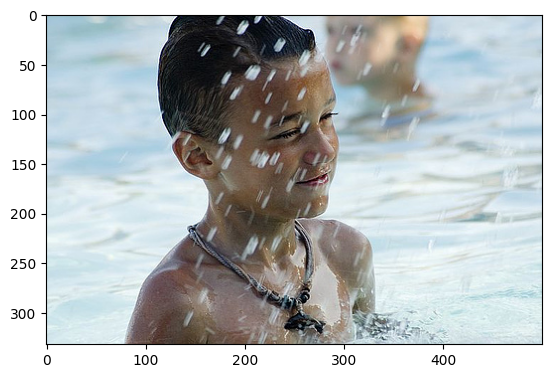

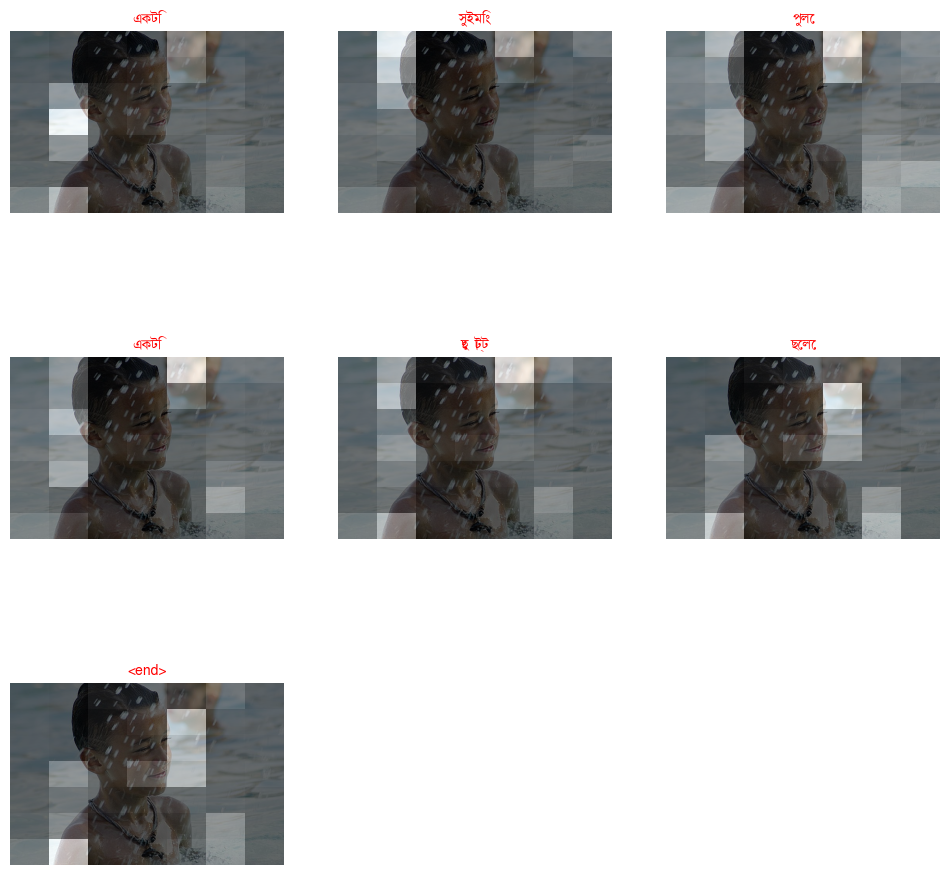

In [105]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কৃষ্ণকেশী একজন মহিলা জ্বলন্ত আগরবাতি দেখছে', 'একজন মহিলা বাষ্পে ভরা প্লেটের দিকে তাকিয়ে আছেন', 'মহিলাটি দাঁড়িয়ে ধূপাকাঠি জ্বলছে তা দেখছে', 'এক মহিলা আগরবাতি জ্বালিয়ে প্রার্থনা করছেন', 'একজন নারী একটি ধোঁয়াপূর্ণ বস্তুর দিকে তাকিয়ে আছে']
Prediction Caption: কৃষ্ণকেশী মানুষ কিছু মানুষ
BLEU-1: 15.163266
BLEU-2: 6.519133
BLEU-3: 4.011064
BLEU-4: 3.701852
Meteor Score: 0.086207


ValueError: ignored

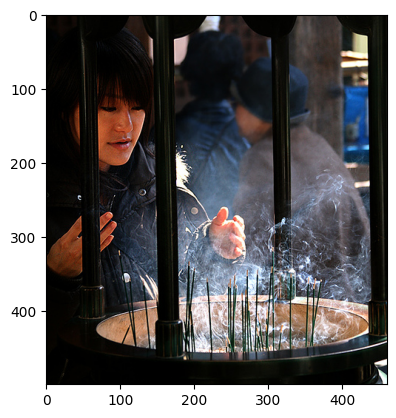

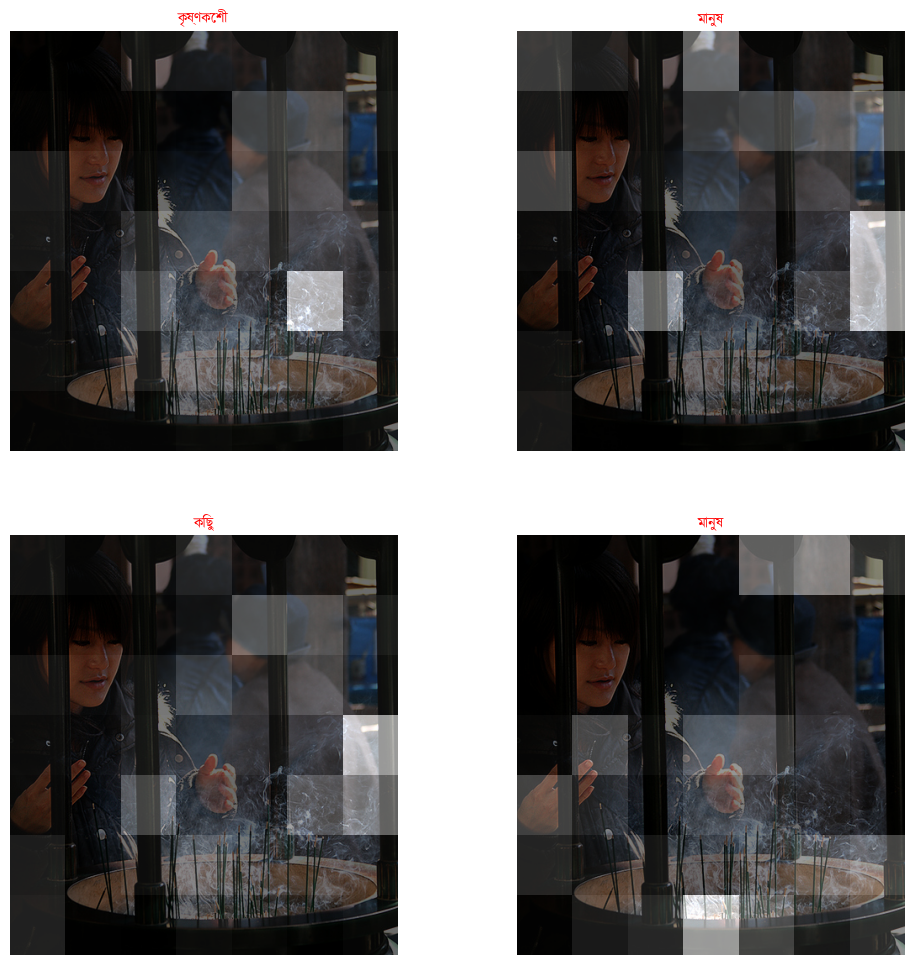

In [106]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

In [ ]:
cap_test_data = test_caption.copy()
rid = 100
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি ব্রিন্ডল লেপযুক্ত কুকুর একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি জাম্পিং ব্রাউন কুকুরের দিকে ঘেউ ঘেউ করছে', 'দুটি কুকুর খেলছে একজন লোক তা দেখছে', 'খেলা করা দুটি কুকুরের সাথে একজন লোক দাঁড়িয়ে আছেন', 'একটি লোক একটি খেঁকী বাদামী ও কালো কুকুর এবং একটি দাঁড়ানো হালকা বাদামী কুকুরের পাশে দাঁড়িয়ে আছে', 'দুটি কুকুর একটি বাদামী এবং একটি ধুসর বর্ণের জিন্স পরা এক ব্যাক্তির পায়ের পাশে খেলছে']
Prediction Caption: দুটি কুকুর একটি পার্কের ঘেরের অভ্যন্তরে খেলছে
BLEU-1: 100.000000
BLEU-2: 91.287093
BLEU-3: 86.698879
BLEU-4: 75.983569
Meteor Score: 0.365079


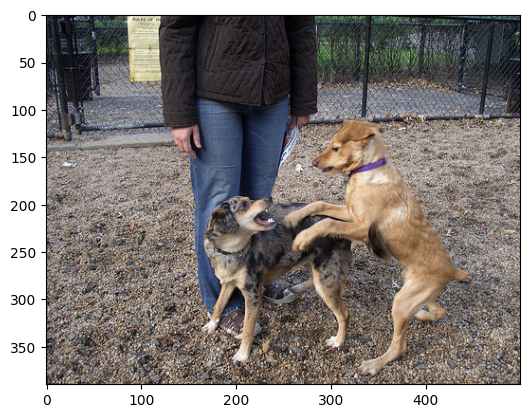

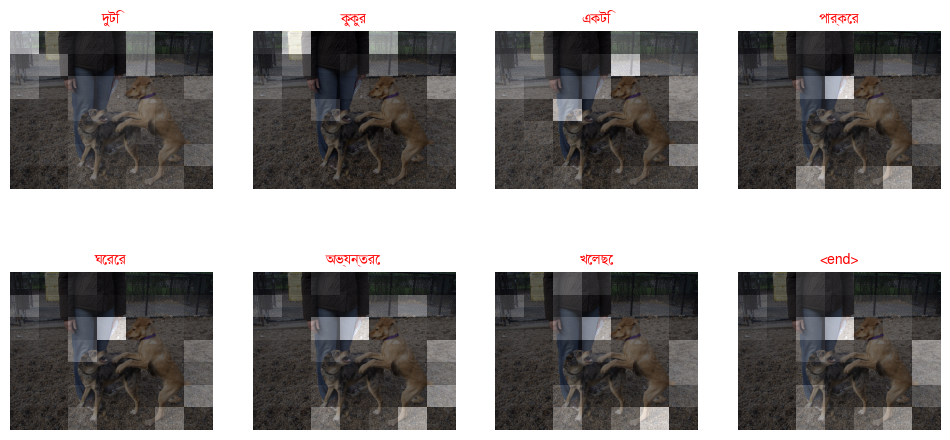

In [107]:
cap_test_data = test_caption.copy()
rid = 1205
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি হকি খেলা হচ্ছে', 'দুজন মানুষ খেলার পোশাকে মাঠে দৌড়াচ্ছে', 'বেগুনি সাদা এবং কালো রঙের একটি খেলোয়াড় মাঠের শেষের কাছে একটি নাটক তৈরি করার চেষ্টা করে', 'পনেরো নম্বর জার্সি পরিহিত একজন খেলোয়াড় ল্যাক্রোস বল নিয়ে দৌড়াচ্ছে', 'দুজন লাক্রোসে খেলোয়াড় খেলার মাঠে দৌড়াচ্ছে']
Prediction Caption: হকি খেলা হচ্ছে
BLEU-1: 71.653131
BLEU-2: 71.653131
BLEU-3: 71.653131
BLEU-4: 41.252121
Meteor Score: 0.754986


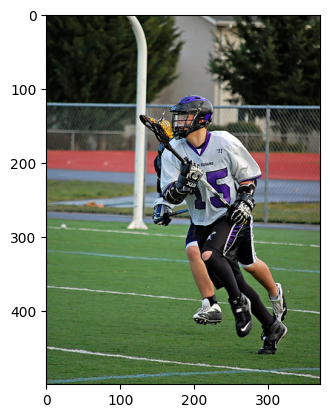

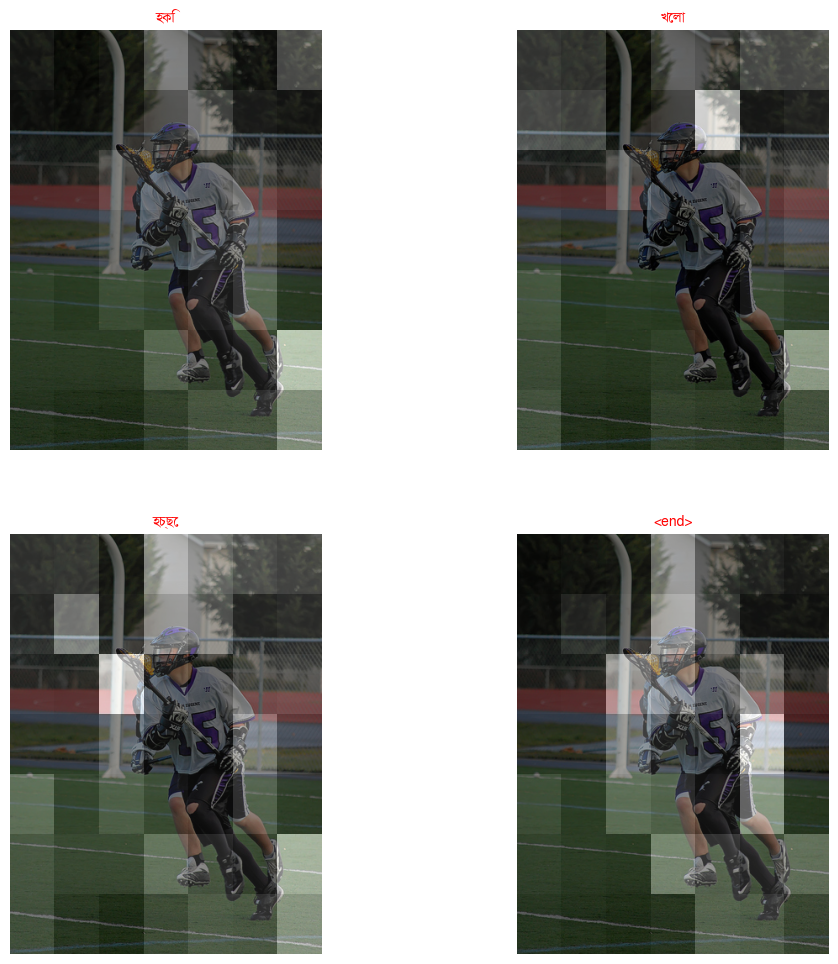

In [108]:
cap_test_data = test_caption.copy()
rid = 2408
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কাউবয় টুপি পরা মেয়েটি একটি ভেড়া নিয়ে দাঁড়িয়ে আছে', 'একটি গোলাপী টুপি পরা একটি মেয়ে ধূলিকণা পথে ভেড়ার পাশে হাঁটছে', 'গোলাপি টুপি পরে মেয়েটি একটি ভেড়া নিয়ে হাঁটছে', 'গোলাপি রাখাল টুপি পড়া এক ছোট মেয়ে একটি ফিতায় বাধা ভেড়া ধরে আছে', 'মেয়েটি পিংক রংয়ের রাখালী টুপি এবং পিংক বুট পরেছে']
Prediction Caption: একটি বাচ্চা হাটছে
BLEU-1: 6.295853
BLEU-2: 2.555774
BLEU-3: 1.724233
BLEU-4: 1.369301
Meteor Score: 0.066667


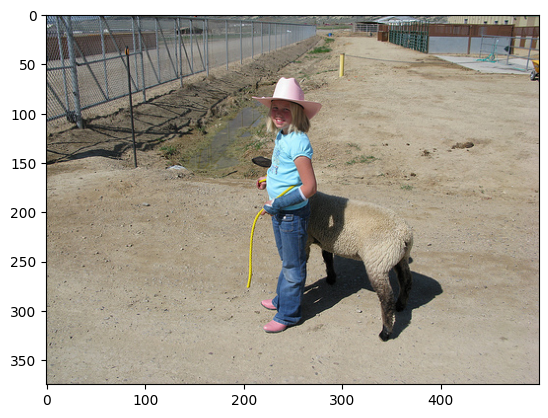

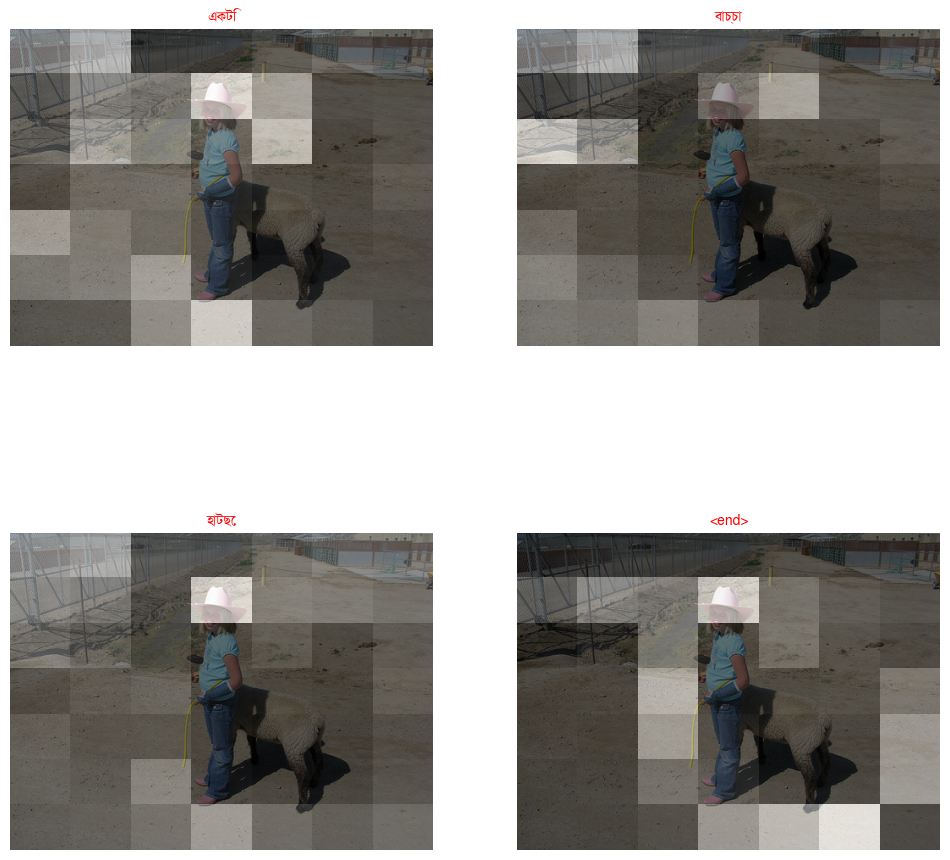

In [109]:
cap_test_data = test_caption.copy()
rid = 161
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['বৃদ্ধ লোকটি থাম্বস আপ দিচ্ছেন', 'ধূসর দাড়ি এবং ডেনিম টুপিযুক্ত একটি মানুষ হাত দিয়ে থাম্বস আপ সাইন দেয়', 'একটি সাদা কেশিক দাড়ি এবং একটি নীল ক্যাপযুক্ত একটি বৃদ্ধ ব্যক্তি তার ডান হাত দিয়ে থাম্বস আপ সাইন দেয়', 'সাদা দাড়ি ওয়ালা লোকটি বৃদ্ধাঙ্গুলি দেখাচ্ছে', 'সাদা ক্যাপ পড়া বয়স্ক ব্যক্তি থাম্বস আপ দেখাচ্ছে']
Prediction Caption: নীল ক্যাপযুক্ত একটি লোক একটি নীল এবং একটি লোক
BLEU-1: 66.666667
BLEU-2: 57.735027
BLEU-3: 33.873784
BLEU-4: 20.435063
Meteor Score: 0.236883


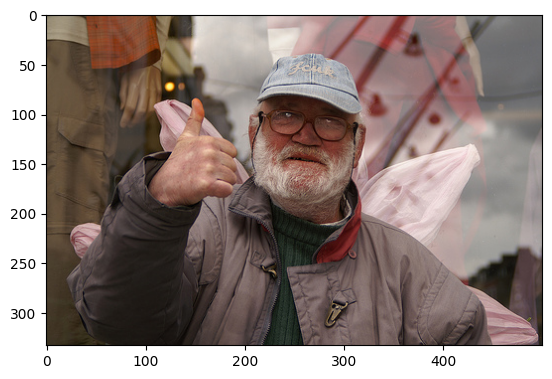

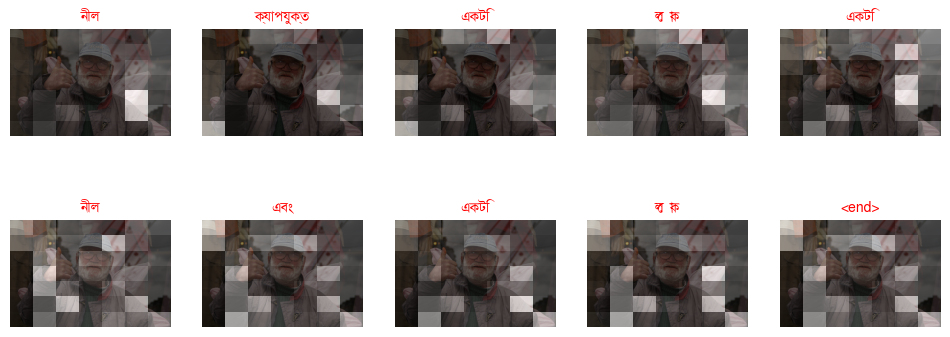

In [110]:
cap_test_data = test_caption.copy()
rid = 235
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি কালো সাদা কুকুর একটি কাঠের তক্তার উপর ভারসাম্য রাখছে', 'কুকুরটি একটি কাঠ দন্ডের উপর হাঁটছে', 'একটি কুকুর প্লাটফর্মের উপরে এক্রোবেটিক কৌশল প্রদর্শন করছে', 'নীল রেলিং এর পাশে লাল কাঠের তক্তার উপর একটি কুকুর হাঁটছে', 'একটি উঁচু তক্তার উপর কুকুরটি হাঁটছে']
Prediction Caption: একটি কুকুর প্লাটফর্মের উপর দৌড়াচ্ছে
BLEU-1: 65.498460
BLEU-2: 51.781079
BLEU-3: 40.298236
BLEU-4: 26.350378
Meteor Score: 0.382395


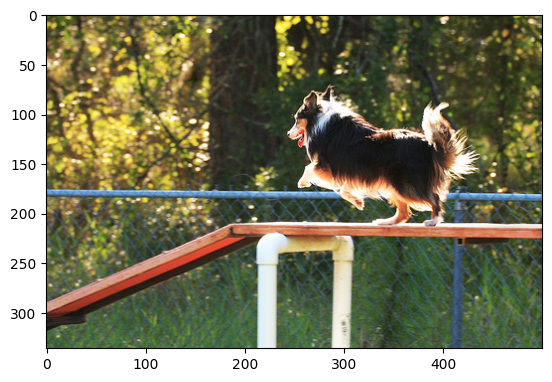

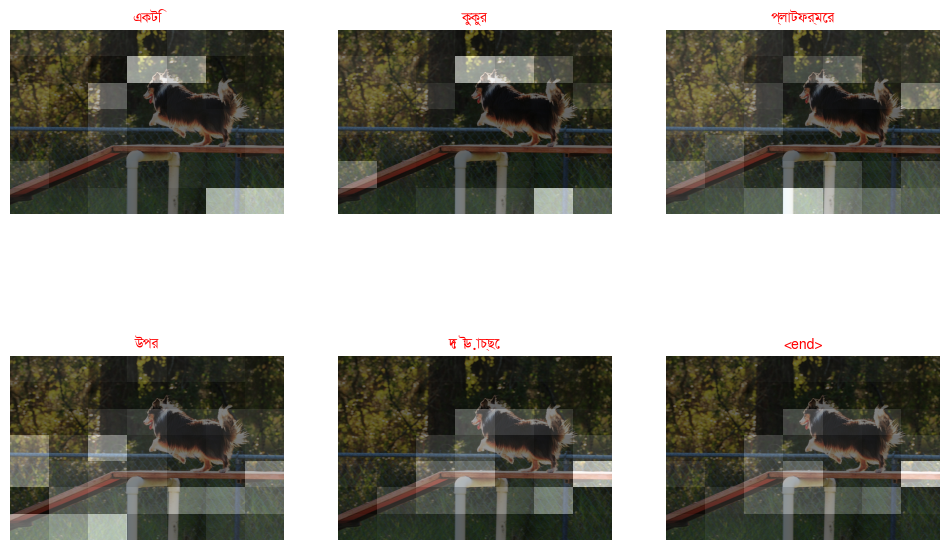

In [111]:
cap_test_data = test_caption.copy()
rid = 2935
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

In [112]:
b1=[]
b2=[]
b3=[]
b4=[]
m_score = []

for rid in range(0,len(test_data)):
  test_image= test_data[rid]
  real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
  result, attention_plot, pred_test = evaluate(test_image)   
  pred_caption=' '.join(result).rsplit(' ', 1)[0]
  reference = real_caption
  candidate = pred_caption.split()
  print(pred_caption)
  smooth = SmoothingFunction().method4
  bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
  bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
  bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
  bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
  b1.append(bleu1)
  b2.append(bleu2)
  b3.append(bleu3)
  b4.append(bleu4)
  score = meteor_score(reference,candidate)
  m_score.append(score)

একজন ব্যক্তি রাতে একটি কৌশল দেখাচ্ছে
একটি ছোট শিশু একটি গোলাপি বল লাথি দিচ্ছে
একটি কুকুর একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা একটি গাছের পাশে বরফ ঘেরা
সাদা রঙের হেলমেট পরা লোক সাদা দড়ি দিয়ে হাঁটছেন
বল কুড়ানো খেলার সময় একটি কালো বল নিয়ে একটি কালো বল নিয়ে একটি কালো বল নিয়ে খেলছে
তারাভরা আকাশের নিচে রাতের আকাশ একটি পাথুরে পৃষ্ঠে বিশাল পাথর খণ্ডের পাশ দিয়ে একটি পাথুরে পৃষ্ঠে বিশাল পাথর খণ্ডের পাশ দিয়ে একটি পাথুরে পৃষ্ঠে বিশাল পাথর খণ্ডের পাশ দিয়ে একটি পাথুরে পৃষ্ঠে বিশাল পাথর খণ্ডের পাশ দিয়ে একটি পাথুরে পৃষ্ঠে বিশাল পাথর খণ্ডের পাশ দ

In [113]:
print('BLEU-1: %f' % np.mean(b1))
print('BLEU-2: %f' % np.mean(b2))
print('BLEU-3: %f' % np.mean(b3))
print('BLEU-4: %f' % np.mean(b4))

BLEU-1: 64.767001
BLEU-2: 55.220144
BLEU-3: 45.942163
BLEU-4: 40.508437


In [114]:
print('Meteor Score of Bahdanau attention: %f' % np.mean(m_score))

Meteor Score of Bahdanau attention: 0.521853
